<center><h1>Maharajwala_Raj_HW5</h1></center>
<br>
<br>

Name: Raj Vijay Maharajwala
<br>
Github Username: RajMaharajwala
<br>
USC ID: 4863-3649-66

## 1. Decision Trees as Interpretable Models

Import packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import cufflinks as cf
import warnings
# !pip install -U scikit-learn
# !pip install pydotplus
import pydotplus
from IPython.display import Image
# !pip install graphviz
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import _tree
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputClassifier
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score,classification_report
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import statsmodels.api as sm
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

### (a) Obtain Data

Get the Accute Inamations Data Set

In [2]:
df = pd.read_csv('../data/diagnosis.data', sep='\t', encoding='UTF_16', header=None, decimal=',', names = ["a1", "a2", "a3", "a4", "a5", "a6", "d1", "d2"])
df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


### (b) Build a decision tree

In [3]:
df.replace({'no': 0, 'yes': 1}, inplace=True)
X, Y1, Y2 = df.iloc[:,:-2], df[['d1']], df[['d2']]  

In [4]:
def DT_plot(X, Y):
    clf = DecisionTreeClassifier(random_state=42)
    model = clf.fit(X, Y)
    text = tree.export_text(clf, feature_names = list(X.columns))
    print(text)
    plt.figure(figsize=(7,10))
    tree.plot_tree(clf, filled=True, rounded=True,feature_names = X.columns, class_names=['0','1'])
    return clf

|--- a4 <= 0.50
|   |--- class: 0
|--- a4 >  0.50
|   |--- a5 <= 0.50
|   |   |--- a6 <= 0.50
|   |   |   |--- class: 1
|   |   |--- a6 >  0.50
|   |   |   |--- class: 0
|   |--- a5 >  0.50
|   |   |--- class: 1



DecisionTreeClassifier(random_state=42)

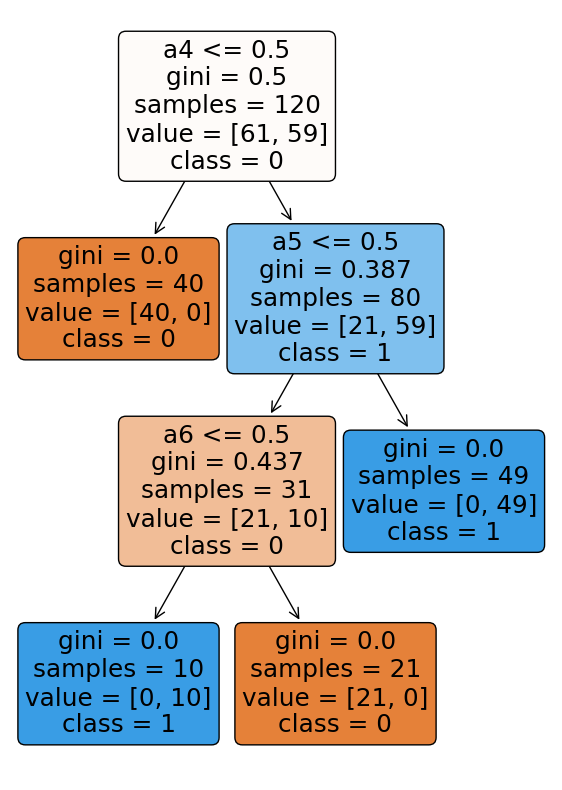

In [5]:
DT_plot(X, Y1)

|--- a1 <= 37.95
|   |--- class: 0
|--- a1 >  37.95
|   |--- a3 <= 0.50
|   |   |--- class: 0
|   |--- a3 >  0.50
|   |   |--- class: 1



DecisionTreeClassifier(random_state=42)

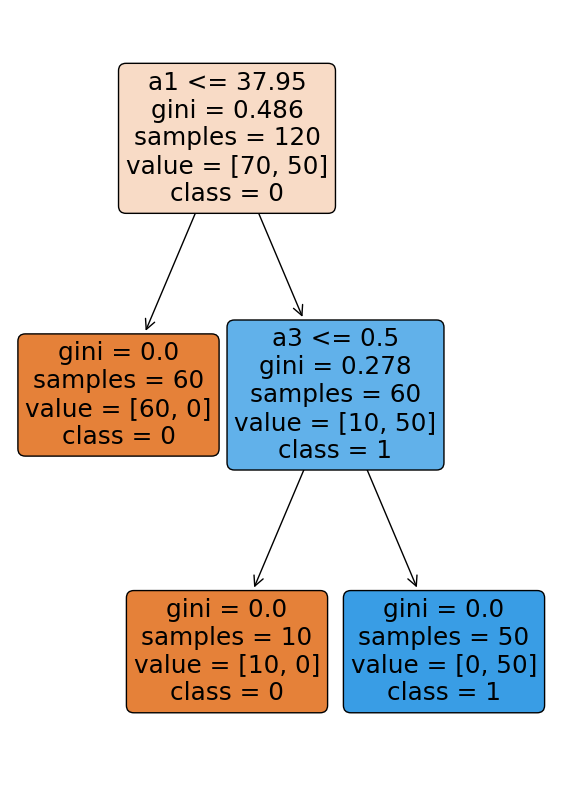

In [6]:
DT_plot(X, Y2)

|--- a1 <= 37.95
|   |--- a4 <= 0.50
|   |   |--- class: 0
|   |--- a4 >  0.50
|   |   |--- class: 1
|--- a1 >  37.95
|   |--- a3 <= 0.50
|   |   |--- class: 0
|   |--- a3 >  0.50
|   |   |--- a2 <= 0.50
|   |   |   |--- class: 0
|   |   |--- a2 >  0.50
|   |   |   |--- a4 <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- a4 >  0.50
|   |   |   |   |--- class: 0



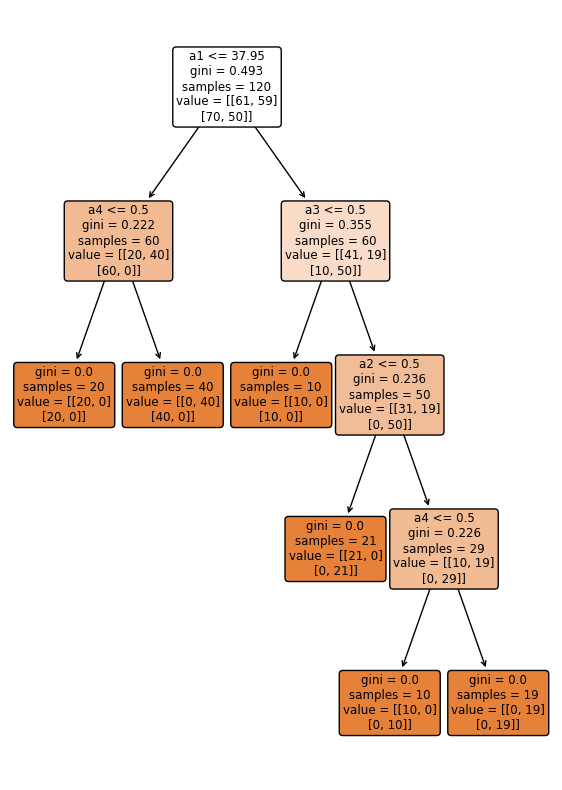

In [7]:
Y = df[['d1','d2']]
clf = DT_plot(X, Y)

### (c) Convert the decision rules

In [8]:
def convert_tree_to_rules(tree, featuress):
    tree_ = tree.tree_
    features = [featuress[i] if i != _tree.TREE_UNDEFINED else "undefined!" for i in tree_.feature]
    print(f"def decision_tree({', '.join(featuress)}):")
    def recurse(node, depth):
        try:
            indent = "  " * depth
            if tree_.feature[node] != _tree.TREE_UNDEFINED:
                name = features[node]
                threshold = tree_.threshold[node]
                print(f"{indent}if {name} <= {threshold}:")
                recurse(tree_.children_left[node], depth + 1)
                print(f"{indent}else:  # if {name} > {threshold}")
                recurse(tree_.children_right[node], depth + 1)
            else:
                print(f"{indent}return {tree_.value[node]}")
        except Exception as e:
            print(f"{type(e)}: {e}")
    recurse(0, 1)
convert_tree_to_rules(clf, X.columns)

def decision_tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if a3 > 0.5
      if a2 <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if a2 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


### (d) Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.

In [9]:
#Used GridSearchCV for Cross-Validation
def GridSearchCV_params_score():
    params = [x+1 for x in range(10)] 
    #print(params)
    parameters = {'max_depth': params}
    clf = GridSearchCV(DecisionTreeClassifier(random_state=42), parameters)
    clf.fit(X, Y)
    dict1 = {'best_score': round(clf.best_score_, 4), 'best_params': clf.best_params_, 'accurate_model': clf.best_estimator_}
    return dict1
GridSearchCV_results = GridSearchCV_params_score()
print(GridSearchCV_results)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20)

{'best_score': 0.95, 'best_params': {'max_depth': 4}, 'accurate_model': DecisionTreeClassifier(max_depth=4, random_state=42)}


[Text(0.4, 0.9, 'a1 <= 37.95\ngini = 0.493\nsamples = 96\nvalue = [[49, 47]\n[56, 40]]'),
 Text(0.2, 0.7, 'a4 <= 0.5\ngini = 0.23\nsamples = 50\nvalue = [[18, 32]\n[50, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 18\nvalue = [[18, 0]\n[18, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 32\nvalue = [[0, 32]\n[32, 0]]'),
 Text(0.6, 0.7, 'a3 <= 0.5\ngini = 0.333\nsamples = 46\nvalue = [[31, 15]\n[6, 40]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 6\nvalue = [[6, 0]\n[6, 0]]'),
 Text(0.7, 0.5, 'a2 <= 0.5\ngini = 0.234\nsamples = 40\nvalue = [[25, 15]\n[0, 40]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 15\nvalue = [[15, 0]\n[0, 15]]'),
 Text(0.8, 0.3, 'a4 <= 0.5\ngini = 0.24\nsamples = 25\nvalue = [[10, 15]\n[0, 25]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[0, 10]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 15\nvalue = [[0, 15]\n[0, 15]]')]

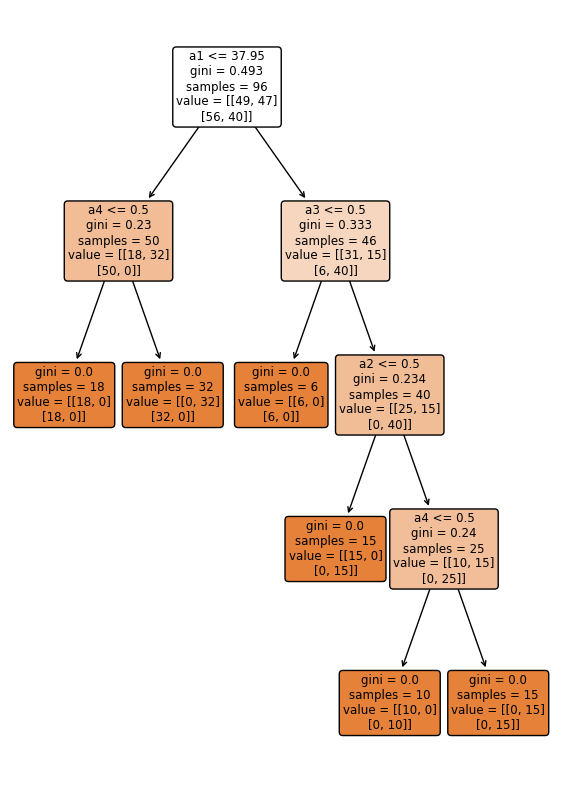

In [10]:
best_clf = DecisionTreeClassifier(random_state=42, ccp_alpha=0.0, max_depth = 4)
best_c = MultiOutputClassifier(best_clf)
best_clf.fit(X_train, Y_train)
Y_train_pred = best_clf.predict(X_train)
Y_test_pred = best_clf.predict(X_test)
plt.figure(figsize=(7,10))
tree.plot_tree(best_clf, filled=True, rounded=True,feature_names = X.columns, class_names=['0','1'])

In [11]:
print(f"Train Accuracy = {accuracy_score(Y_train, Y_train_pred)}")
print(f"Test Accuracy = {accuracy_score(Y_test, Y_test_pred)}")

Train Accuracy = 1.0
Test Accuracy = 1.0


In [12]:
convert_tree_to_rules(best_clf, X_train.columns)

def decision_tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[18.  0.]
 [18.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 32.]
 [32.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[6. 0.]
 [6. 0.]]
    else:  # if a3 > 0.5
      if a2 <= 0.5:
        return [[15.  0.]
 [ 0. 15.]]
      else:  # if a2 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 15.]
 [ 0. 15.]]


|--- temperature <= 37.95
|   |--- urine_pushing <= 0.50
|   |   |--- class: 0
|   |--- urine_pushing >  0.50
|   |   |--- class: 1
|--- temperature >  37.95
|   |--- lumbar_pain <= 0.50
|   |   |--- class: 0
|   |--- lumbar_pain >  0.50
|   |   |--- nausea_occurence <= 0.50
|   |   |   |--- class: 0
|   |   |--- nausea_occurence >  0.50
|   |   |   |--- urine_pushing <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- urine_pushing >  0.50
|   |   |   |   |--- class: 0



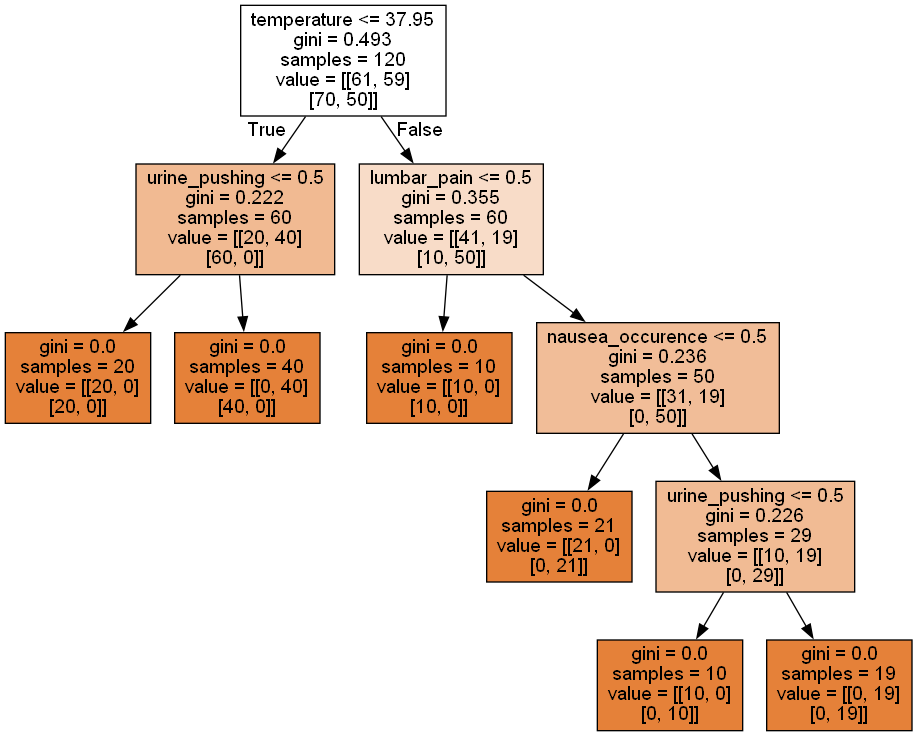

In [13]:
accurate_model = GridSearchCV_results['accurate_model']

def DT_Rules_simplified():
    features = ['temperature', 'nausea_occurence', 'lumbar_pain', 'urine_pushing', 'micturition_pains', 'burning_urethra']
    features_d1_d2 = ['inflammation_pred', 'nephritis_pred']
    text = tree.export_text(best_clf, feature_names = features)
    print(text)
    dot_data = tree.export_graphviz(accurate_model, out_file=None, feature_names=features,  class_names=features_d1_d2, filled=True)
    graph = pydotplus.graph_from_dot_data(dot_data)
    Image(graph.create_png())
    return Image(graph.create_png())

# DOT Data
DT_Rules_simplified()

## 2. The LASSO and Boosting for Regression

### (a) Obtain Data

In [14]:
with open('../data/communities.names') as fin:
    clmn = []
    for line in fin:
        if line.startswith("@attribute"):
            clmn.append(line.rstrip().split()[1])
print(len(clmn))
print(clmn)

128
['state', 'county', 'community', 'communityname', 'fold', 'population', 'householdsize', 'racepctblack', 'racePctWhite', 'racePctAsian', 'racePctHisp', 'agePct12t21', 'agePct12t29', 'agePct16t24', 'agePct65up', 'numbUrban', 'pctUrban', 'medIncome', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'medFamInc', 'perCapInc', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'NumUnderPov', 'PctPopUnderPov', 'PctLess9thGrade', 'PctNotHSGrad', 'PctBSorMore', 'PctUnemployed', 'PctEmploy', 'PctEmplManu', 'PctEmplProfServ', 'PctOccupManu', 'PctOccupMgmtProf', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'TotalPctDiv', 'PersPerFam', 'PctFam2Par', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMomYoungKids', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRecent', 'PctImmigRec5', 'PctImmigRec8', 'PctImmigRec10', 'PctRecentImmig', 'PctRecImmig5', 'PctRecImmig8', 'PctRecImmig10', 'PctSpeakEn

In [15]:
df = pd.read_csv('../data/communities.data', na_values='?', names = clmn)
df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [16]:
dftrain, dftest = df.iloc[:1495], df.iloc[1495:].reset_index(drop=True)

In [17]:
print(f"Test set is about {round((dftest.shape[0]/df.shape[0])*100,2)}%")

Test set is about 25.03%


### (b) Missing values

In [18]:
#from the data description it is clear that the first 5 columns are not predictive
df, dftrain, dftest = df.iloc[:,5:], dftrain.iloc[:,5:], dftest.iloc[:,5:]

In [19]:
print(f"df shape = {df.shape}\ndf train shape = {dftrain.shape}\ndf test shape = {dftest.shape}")

df shape = (1994, 123)
df train shape = (1495, 123)
df test shape = (499, 123)


In [20]:
missing_data_stats = dict(sorted(df.isna().sum().to_dict().items(), key = lambda x:x[1], reverse=True))
missing_data_stats

{'LemasSwornFT': 1675,
 'LemasSwFTPerPop': 1675,
 'LemasSwFTFieldOps': 1675,
 'LemasSwFTFieldPerPop': 1675,
 'LemasTotalReq': 1675,
 'LemasTotReqPerPop': 1675,
 'PolicReqPerOffic': 1675,
 'PolicPerPop': 1675,
 'RacialMatchCommPol': 1675,
 'PctPolicWhite': 1675,
 'PctPolicBlack': 1675,
 'PctPolicHisp': 1675,
 'PctPolicAsian': 1675,
 'PctPolicMinor': 1675,
 'OfficAssgnDrugUnits': 1675,
 'NumKindsDrugsSeiz': 1675,
 'PolicAveOTWorked': 1675,
 'PolicCars': 1675,
 'PolicOperBudg': 1675,
 'LemasPctPolicOnPatr': 1675,
 'LemasGangUnitDeploy': 1675,
 'PolicBudgPerPop': 1675,
 'OtherPerCap': 1,
 'population': 0,
 'householdsize': 0,
 'racepctblack': 0,
 'racePctWhite': 0,
 'racePctAsian': 0,
 'racePctHisp': 0,
 'agePct12t21': 0,
 'agePct12t29': 0,
 'agePct16t24': 0,
 'agePct65up': 0,
 'numbUrban': 0,
 'pctUrban': 0,
 'medIncome': 0,
 'pctWWage': 0,
 'pctWFarmSelf': 0,
 'pctWInvInc': 0,
 'pctWSocSec': 0,
 'pctWPubAsst': 0,
 'pctWRetire': 0,
 'medFamInc': 0,
 'perCapInc': 0,
 'whitePerCap': 0,
 'bl

In [21]:
# #Checking the unique dtype for all the missing values, found it to be flot so all numeric
# set([df[k].dtypes for k, v in missing_data_stats.items() if v > 0])

In [22]:
#Checking the unique dtype for all the missing values, found it to be float so all numeric data
set([df[k].dtypes for k, v in missing_data_stats.items() if v > 0])

{dtype('float64')}

In [23]:
# All the missing Value is numeric, I am using Mice with bounds for handling those missing values
imputer=IterativeImputer(min_value=0, max_value=1, imputation_order='ascending',max_iter=10,random_state=42,n_nearest_features=5)
imputed_dataset = imputer.fit_transform(df)

In [24]:
type(imputed_dataset)

numpy.ndarray

In [25]:
df_cleaned = pd.DataFrame(imputed_dataset, columns = df.columns)
df_cleaned

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.036815,0.000000,0.765068,0.393296,0.00,0.129572,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.019823,0.000000,0.698471,0.443703,0.00,0.162902,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.002058,0.000000,0.630525,0.431566,0.00,0.236563,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.014476,0.003756,0.703025,0.469972,0.00,0.192174,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.032875,0.000000,0.756912,0.472215,0.00,0.148703,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.061964,0.008136,0.694371,0.434944,0.00,0.156452,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


In [26]:
df_cleaned.isna().any().any()

False

### (c) Plot a correlation matrix

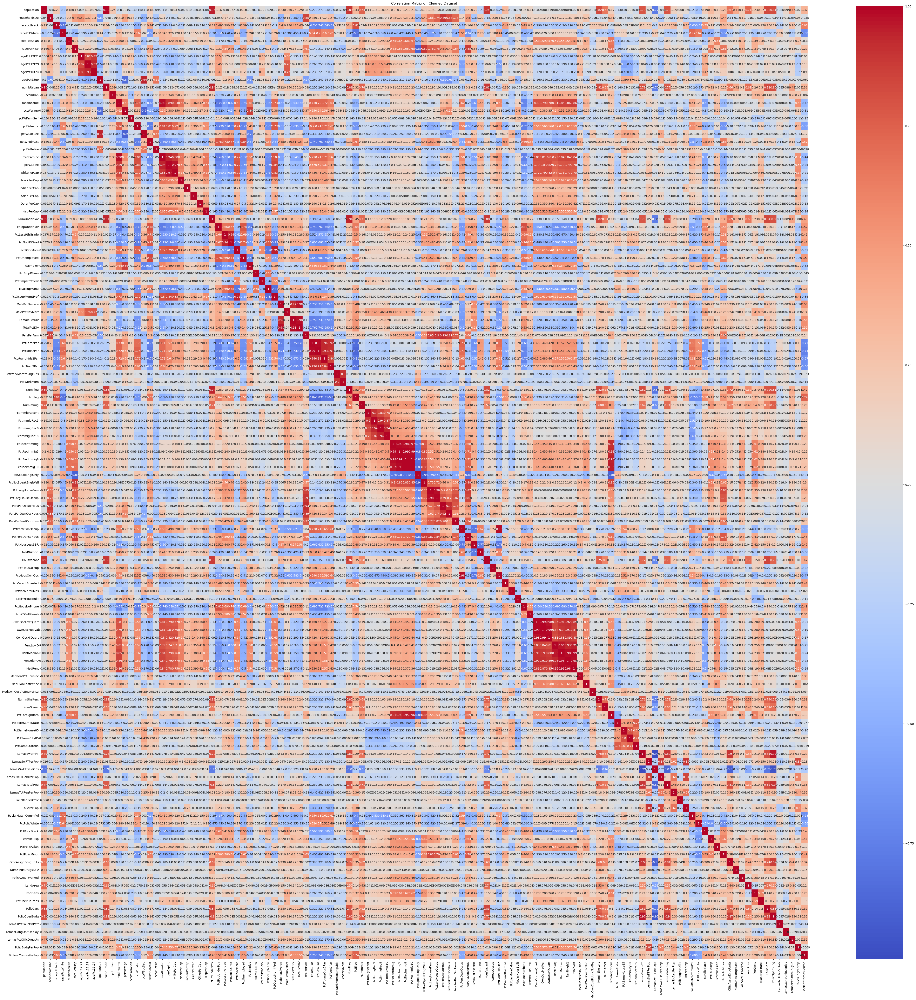

In [27]:
plt.figure(figsize=(60, 60))
sns.heatmap(df_cleaned.corr(), annot = True, cmap="coolwarm")
plt.title("Correlation Matrix on Cleaned Dataset")
plt.show()

### (d) Calculate the Coefficient of Variation CV

In [28]:
cv = (df_cleaned.std() / df_cleaned.mean()).to_dict()
cv

{'population': 2.203502536390972,
 'householdsize': 0.3532983018683109,
 'racepctblack': 1.4109203963756864,
 'racePctWhite': 0.3237815624993411,
 'racePctAsian': 1.3591621938222074,
 'racePctHisp': 1.614277791710685,
 'agePct12t21': 0.36583986883972397,
 'agePct12t29': 0.29069288841904145,
 'agePct16t24': 0.4951605143654288,
 'agePct65up': 0.42344170889026195,
 'numbUrban': 2.0017436381957676,
 'pctUrban': 0.6388488712113656,
 'medIncome': 0.5797533935755996,
 'pctWWage': 0.3277100586060616,
 'pctWFarmSelf': 0.7000301156104908,
 'pctWInvInc': 0.35923994722340613,
 'pctWSocSec': 0.36851263032540155,
 'pctWPubAsst': 0.699030504203365,
 'pctWRetire': 0.3496390828575848,
 'medFamInc': 0.527731885342079,
 'perCapInc': 0.545633428419145,
 'whitePerCap': 0.5075521907214038,
 'blackPerCap': 0.5894690036844645,
 'indianPerCap': 0.8096850868666168,
 'AsianPerCap': 0.6061938508790911,
 'OtherPerCap': 0.6707586774546991,
 'HispPerCap': 0.4739597186074789,
 'NumUnderPov': 2.304969714852185,
 'PctP

In general, higer the CV higher the variablity

### (e) Scatter plots and box plots for highest CV features

In [29]:
CVdict = sorted(cv.items(), key = lambda x:x[1], reverse=True)
Top_CV = dict(CVdict[:round(128**0.5)])
Top_CV

{'LemasSwornFT': 4.422741020571133,
 'NumStreet': 4.407702440863974,
 'PolicOperBudg': 4.242829198856786,
 'NumInShelters': 3.4854812687233436,
 'NumIlleg': 2.9941964494842983,
 'NumImmig': 2.9004971638852743,
 'LemasPctOfficDrugUn': 2.555266002927139,
 'NumUnderPov': 2.304969714852185,
 'population': 2.203502536390972,
 'PolicCars': 2.018817645281481,
 'numbUrban': 2.0017436381957676}

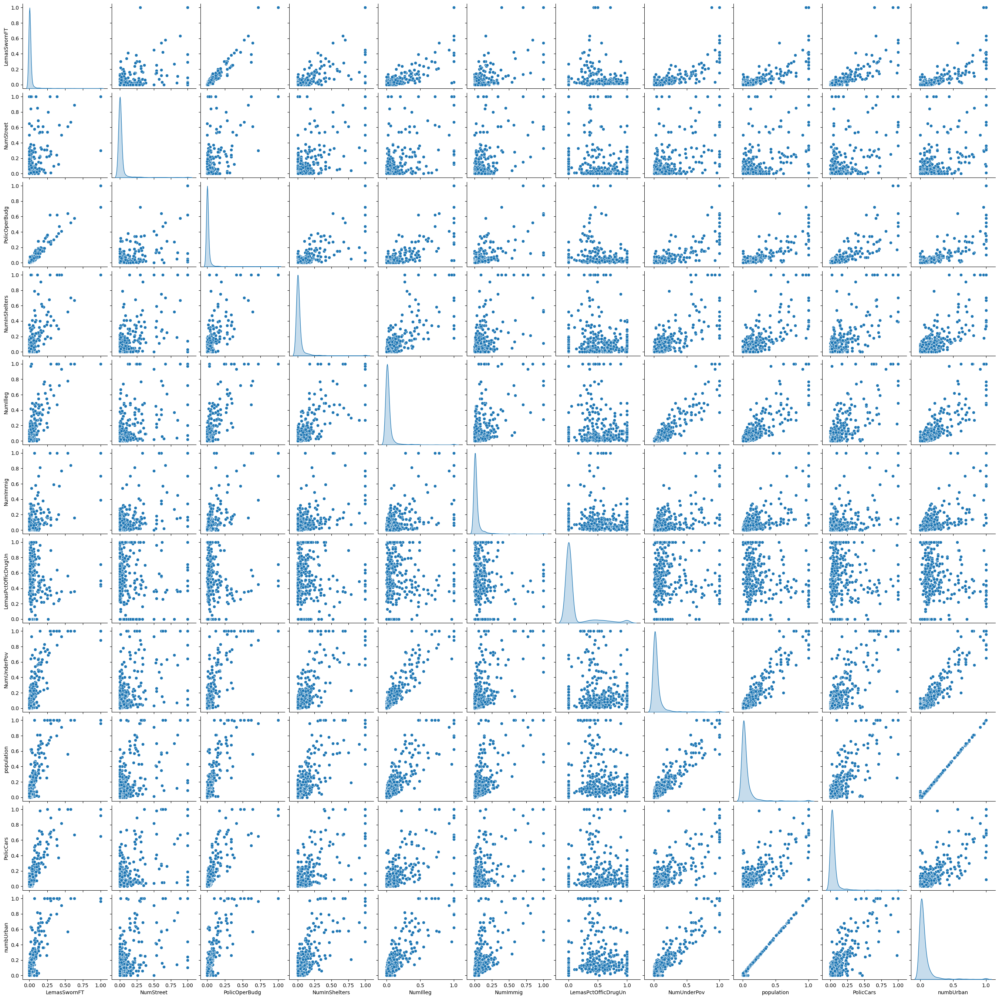

In [30]:
selected_features = list(Top_CV.keys())
sns.pairplot(df_cleaned[selected_features], diag_kind='kde')
plt.show()

[]

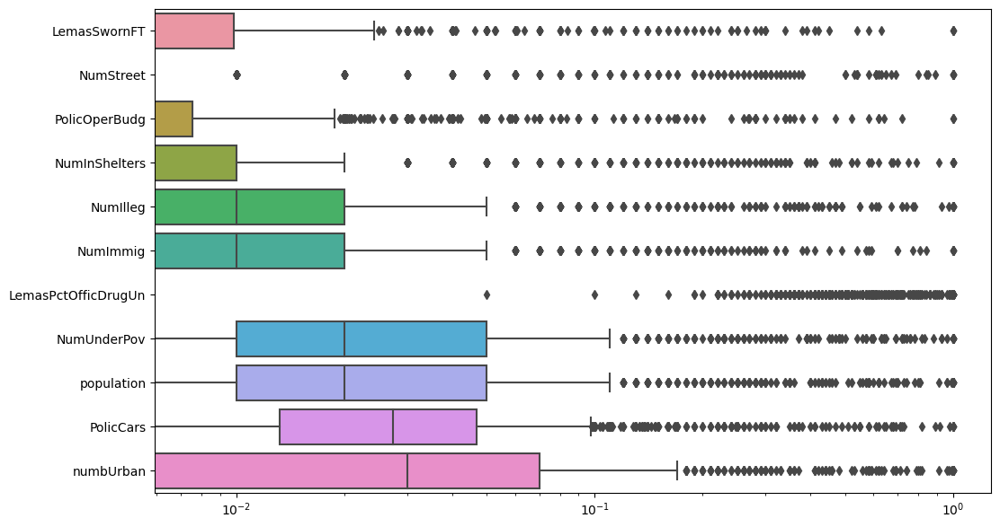

In [31]:
fig, axes = plt.subplots(figsize=(12, 7))
box = sns.boxplot(data=df_cleaned[selected_features], ax=axes, orient='h')
box.set(xscale="log")
plt.plot()

In [32]:
print(selected_features)

['LemasSwornFT', 'NumStreet', 'PolicOperBudg', 'NumInShelters', 'NumIlleg', 'NumImmig', 'LemasPctOfficDrugUn', 'NumUnderPov', 'population', 'PolicCars', 'numbUrban']


**Observation:**

```
1. population and numbUrban is higly positively correlated
2. numUrban and NumUnderPov seems to be positively correlated
3. population and NumUnderPov seems to be positively correlated
4. NumIlleg and NumUnderPov seems to be positively correlated
5. PolicOperBudg and LemasSwornFT seems to be positively correlated
6. There seems to be many outlier from boxplot, although the dataset is already normalised in range from 0 to 1.
7. numbUrban has highest interquartile range on the normalised data
```

### (f) Fit a linear model

In [33]:
dftrain_cleaned, dftest_cleaned = df_cleaned.iloc[:1495], df_cleaned.iloc[1495:].reset_index(drop=True)
Xtrain, Ytrain = dftrain_cleaned.iloc[:,:-1], dftrain_cleaned.iloc[:,-1:]
Xtest, Ytest = dftest_cleaned.iloc[:,:-1], dftest_cleaned.iloc[:,-1:]

In [34]:
model = sm.OLS(Ytrain, sm.add_constant(Xtrain)).fit()
display(model.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ViolentCrimesPerPop   R-squared:                       0.751
Model:                             OLS   Adj. R-squared:                  0.728
Method:                  Least Squares   F-statistic:                     33.86
Date:                 Thu, 23 Mar 2023   Prob (F-statistic):               0.00
Time:                         18:32:54   Log-Likelihood:                 1065.3
No. Observations:                 1495   AIC:                            -1885.
Df Residuals:                     1372   BIC:                            -1232.
Df Model:                          122                                         
Covariance Type:             nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.0010      0.824     -0.001      0.999      -1.617       1.615
population                0.1098      0.443      0.248      0.804      -0.760       0.980
householdsize             0.0200      0.091      0.221      0.825      -0.158       0.198
racepctblack              0.2030      0.056      3.616      0.000       0.093       0.313
racePctWhite              0.0876      0.062      1.405      0.160      -0.035       0.210
racePctAsian             -0.0302      0.039     -0.776      0.438      -0.106       0.046
racePctHisp              -0.0097      0.060     -0.160      0.873      -0.128       0.109
agePct12t21               0.1590      0.120      1.323      0.186      -0.077       0.395
agePct12t29              -0.1559      0.178     -0.877      0.381      -0.505       0.193
agePct16t24              -0.1705      0.184     -0.928      0.353      -0.531       0.190
agePct65up                0.0897      0.115      0.778      0.437      -0.137       0.316
numbUrban                -0.1973      0.432     -0.456      0.648      -1.046       0.651
pctUrban                  0.0448      0.017      2.569      0.010       0.011       0.079
medIncome                -0.2183      0.192     -1.139      0.255      -0.594       0.158
pctWWage                 -0.1216      0.100     -1.222      0.222      -0.317       0.074
pctWFarmSelf              0.0423      0.022      1.941      0.053      -0.000       0.085
pctWInvInc               -0.2033      0.075     -2.697      0.007      -0.351      -0.055
pctWSocSec                0.0967      0.117      0.830      0.407      -0.132       0.325
pctWPubAsst              -0.0248      0.051     -0.487      0.627      -0.125       0.075
pctWRetire               -0.1063      0.042     -2.550      0.011      -0.188      -0.025
medFamInc                 0.3874      0.177      2.193      0.029       0.041       0.734
perCapInc                -0.0442      0.206     -0.214      0.831      -0.449       0.361
whitePerCap              -0.1219      0.168     -0.727      0.467      -0.451       0.207
blackPerCap              -0.0391      0.027     -1.426      0.154      -0.093       0.015
indianPerCap              0.0399      0.037      1.079      0.281      -0.033       0.112
AsianPerCap               0.0017      0.021      0.081      0.935      -0.040       0.044
OtherPerCap               0.0268      0.021      1.295      0.195      -0.014       0.067
HispPerCap                0.0244      0.027      0.916      0.360      -0.028       0.077
NumUnderPov               0.2522      0.181      1.392      0.164      -0.103       0.608
PctPopUnderPov           -0.1451      0.070     -2.061      0.040      -0.283      -0.007
PctLess9thGrade          -0.0570      0.073     -0.781      0.435      -0.200       0.086
PctNotHSGrad

In [35]:
Ypred_train = model.predict(sm.add_constant(Xtrain))
Ypred_test = model.predict(sm.add_constant(Xtest))

mse_train = round(mean_squared_error(Ytrain, Ypred_train),4)  
mse_test = round(mean_squared_error(Ytest, Ypred_test),4)
print(f"MSE Train: {mse_train} \nMSE Train: {mse_test}")

MSE Train: 0.0141 
MSE Train: 0.0153


### (g) Fit a ridge regression model

In [36]:
ridgeCV = RidgeCV(alphas=[0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100], cv=5, scoring='neg_mean_squared_error')
ridgeCV.fit(Xtrain, Ytrain)

# Fit the ridge regression model on the training set with the best value of lambda
best_λ = ridgeCV.alpha_
best_ridge = Ridge(alpha=best_λ)
best_ridge.fit(Xtrain, Ytrain)

Ypred = best_ridge.predict(Xtest)
test_error = mean_squared_error(Ytest, Ypred)

print("Best Alpha or λ: ", best_λ)
print("Test error: ", test_error)

Best Alpha or λ:  1.0
Test error:  0.015338912215028871


In [37]:
# param_grid = {'alpha': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100]}
# ridge = Ridge()
# grid_search = GridSearchCV(ridge, param_grid, cv=5, scoring='neg_mean_squared_error')
# grid_search.fit(Xtrain, Ytrain)
# best_λ = grid_search.best_params_['alpha']
# best_ridge = Ridge(alpha=best_λ)
# best_ridge.fit(Xtrain, Ytrain)
# Ypred = best_ridge.predict(Xtest)
# test_error = mean_squared_error(Ytest, Ypred)
# print("Best Alpha or λ: ", best_λ)
# print("Test error: ", test_error)

### (h) Fit a LASSO model

In [38]:
lassoCV = LassoCV(alphas=[0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100], cv=5)
lassoCV.fit(Xtrain, Ytrain)

# Fit the lasso regression model on the training set with the best value of alpha
best_alpha = lassoCV.alpha_
lasso = Lasso(alpha=best_alpha)
lasso.fit(Xtrain, Ytrain)

Ypred = lasso.predict(Xtest)
test_error = mean_squared_error(Ytest, Ypred)

selected_variables = list(Xtrain.columns[lasso.coef_ != 0])

print(f"Best alpha or λ: {best_alpha}\n\nTest error:  {test_error} \n\nTotalSelected Features: {len(selected_variables)}\n\nSelected variables:\n{selected_variables}")

Best alpha or λ: 0.0001

Test error:  0.015264756184807942 

TotalSelected Features: 80

Selected variables:
['racepctblack', 'racePctWhite', 'racePctAsian', 'agePct12t21', 'agePct12t29', 'agePct65up', 'pctUrban', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWRetire', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'PctPopUnderPov', 'PctLess9thGrade', 'PctUnemployed', 'PctEmploy', 'PctEmplManu', 'PctOccupManu', 'PctOccupMgmtProf', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'PctKids2Par', 'PctYoungKids2Par', 'PctWorkMomYoungKids', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRec5', 'PctImmigRec8', 'PctImmigRec10', 'PctRecImmig10', 'PctNotSpeakEnglWell', 'PctLargHouseFam', 'PctLargHouseOccup', 'PersPerOccupHous', 'PctPersOwnOccup', 'PctPersDenseHous', 'PctHousLess3BR', 'MedNumBR', 'HousVacant', 'PctHousOccup', 'PctVacantBoarded', 'PctVacMore6Mos', 'MedYrHousBuilt', 'PctHousNoPhone', 'PctWOFullPlumb', 'OwnOccL

In [39]:
# Other way using GridSearchCV
# lasso = Lasso()
# param_grid = {'alpha': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100]}
# grid_search = GridSearchCV(lasso, param_grid, cv=5)
# grid_search.fit(Xtrain, Ytrain)
# best_alpha = grid_search.best_params_['alpha']
# lasso = Lasso(alpha=best_alpha)
# lasso.fit(Xtrain, Ytrain)
# Ypred = lasso.predict(Xtest)
# test_error = mean_squared_error(Ytest, Ypred)
# selected_variables = list(Xtrain.columns[lasso.coef_ != 0])
# print(f"Best alpha or λ: {best_alpha}\n\nTest error:  {test_error} \n\nTotalSelected Features: {len(selected_variables)}\n\nSelected variables:\n{selected_variables}")

### (i) Fit a PCR model

In [40]:
pipe = make_pipeline(PCA(), Ridge()) # create pipeline with PCA and Ridge regression
param_grid = {'pca__n_components': range(1, Xtrain.shape[1] + 1)}
grid = GridSearchCV(pipe, param_grid=param_grid, cv=5) # perform grid search with cross-validation
grid.fit(Xtrain, Ytrain)
best_M = grid.best_estimator_.named_steps['pca'].n_components # get best value of M from grid search
pca = PCA(n_components=best_M) # fit PCR model on training set with best value of M
Xtrain_pca = pca.fit_transform(Xtrain)
model = Ridge().fit(Xtrain_pca, Ytrain)
Xtest_pca = pca.transform(Xtest) # transform test set with PCA
Ypred_test = model.predict(Xtest_pca)
mse_test = mean_squared_error(Ytest, Ypred_test)
print(f"Best M: {best_M}\nTest error (PCA MSE): {mse_test:.6f}")

Best M: 96
Test error (PCA MSE): 0.015569


### (j) Fit a boosting tree

In [41]:
model = xgb.XGBRegressor(objective="reg:squarederror", tree_method="gpu_hist", gpu_id=0, n_jobs=-1, random_state=42)
param_grid = {"alpha": [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100]}

grid_search = GridSearchCV(model, param_grid, cv=5, scoring="neg_mean_squared_error")
grid_search.fit(Xtrain, Ytrain)
best_params = grid_search.best_params_ 
reg_term = best_params["alpha"]

final_model = xgb.XGBRegressor(objective="reg:squarederror", alpha=reg_term, tree_method="gpu_hist", gpu_id=0, n_jobs=-1, random_state=42)
final_model.fit(Xtrain, Ytrain)

Ypred = final_model.predict(Xtest)
test_error = mean_squared_error(Ytest, Ypred)
print(f"Best alpha: {best_params['alpha']}\nTest error: {test_error:.4f}")

Best alpha: 1
Test error: 0.0113


**References:**
```
1. https://www.analyticsvidhya.com/blog/2021/10/a-complete-guide-to-dealing-with-missing-values-in-python/
2. https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html
3. https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.make_pipeline.html
4. https://www.datacamp.com/tutorial/xgboost-in-python
```